<a href="https://colab.research.google.com/github/dhruvbaliyan/ECommerce-MERN-/blob/main/Object_Detection_Through_SSD_Images_only.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### **Beginner Warning**
This is dependent on a separate library which is not part of Tensorflow (but still made by the Tensorflow team).

Some beginners got "stuck" in the past when Tensorflow 2 came out, but this library was not compatible with Tensorflow 2.

Beginners often feel uncomfortable using older versions of libraries. This is not how things work in the real world.

See "Why bad programmers always need the latest version": https://youtu.be/BIXH_m6CT2I





In [1]:
!pip install -U "numpy==1.26.4" "tensorflow==2.19.0" "tf-models-official==2.19.1" "protobuf<=3.20.3"

In [2]:
!git clone https://github.com/tensorflow/models.git
%cd /content/models/research

Cloning into 'models'...
remote: Enumerating objects: 102910, done.
remote: Counting objects: 100% (217/217), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 102910 (delta 160), reused 98 (delta 90), pack-reused 102693 (from 3)
Receiving objects: 100% (102910/102910), 642.87 MiB | 28.96 MiB/s, done.
Resolving deltas: 100% (74329/74329), done.
/content/models/research


##### **TensorFlow** **Model** **Garden**

A big collection of implemented

*   ML models (vision, NLP, detection, etc.) built with TensorFlow.

*   Contains reference implementations of SOTA papers, plus training scripts, configs, and example datasets.

*   Meant to show best practices and give you ready-to-run code you can fine-tune on your own data.



`Ready-made AI models you can use right away`

**SOTA- State Of The Art**

✔ It is the best-performing model currently known

✔ On a specific task

✔ Compared using a benchmark or public dataset



In [3]:
!ls

adversarial_text    deeplab		   marco	     seq_flow_lite
attention_ocr	    deep_speech		   nst_blogpost      slim
audioset	    delf		   object_detection  vid2depth
autoaugment	    efficient-hrl	   pcl_rl
cognitive_planning  lfads		   README.md
cvt_text	    lstm_object_detection  rebar


####**Install Protobuf**

No need to do this if you are on Colab.

If you're doing this locally, download the latest Protobuf library for your OS from https://github.com/google/protobuf/releases

The filename should look like "protoc-*-*.zip".

Example: protoc-3.17.3-win64.zip if you are using 64-bit Windows.

Assuming you've unzipped this zip file to \<path>, the next step is to add \<path>/bin to your PATH environment variable (on Linux or Mac).

Once Protobuf has been successfully installed, you can run the following command (note: must be done from the models/research folder).

In [4]:
!apt-get install -y protobuf-compiler

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.4).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


In [5]:
!protoc object_detection/protos/*.proto --python_out=.

| Part                              | Meaning                                                              |
| --------------------------------- | -------------------------------------------------------------------- |
| `!`                               | "Run a shell command" (used in Jupyter Notebook / Colab)             |
| `cd models/research/`             | Move into the `research` folder where the Object Detection API lives |
| `&&`                              | Run the next command only if cd worked                               |
| `protoc`                          | Protobuf compiler tool                                               |
| `object_detection/protos/*.proto` | Compile **all** .proto files inside the `protos` folder              |
| `--python_out=.`                  | Output the generated Python files **into the same folder**           |


#### **Install the object detection API**

In [6]:
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .


Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of tensorflow-model-optimization to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of tensorflow-model-optimization to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking 

| Part                                          | What it means                                              | Why we do it                        |
| --------------------------------------------- | ---------------------------------------------------------- | ----------------------------------- |
| `!`                                           | Run shell command (not Python) in a notebook               | Needed in Colab/Jupyter             |
| `cd models/research`                          | Go inside the `research` folder                            | That’s where installation files are |
| `&&`                                          | Only run next command if previous worked                   | Prevents errors                     |
| `cp object_detection/packages/tf2/setup.py .` | Copy the setup file into current folder                    | Prepares installation script        |
| `python -m pip install .`                     | Install the code in the current folder as a Python package | Makes `object_detection` importable |

In [7]:
import os
import pathlib
import time

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from object_detection.utils import label_map_util, visualization_utils as viz_utils

%matplotlib inline

print("TF:", tf.__version__)
print("NumPy:", np.__version__)
print("Imports OK")


TF: 2.19.0
NumPy: 1.26.4
Imports OK


In [8]:
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [14]:
%cd /content

/content


In [15]:
!ls

models	sample_data


In [16]:
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/walkingdog.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/traffic.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/jungle.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/intersection.jpeg
!wget -nc https://media.springernature.com/full/springer-static/image/art%3A10.1038%2Fs41598-023-43458-3/MediaObjects/41598_2023_43458_Fig1_HTML.jpg?as=webp
!wget -nc https://www.codespeedy.com/wp-content/uploads/2020/07/traffic.jpg

--2025-12-06 08:26:52--  https://lazyprogrammer.me/course_files/object_detection_images/walkingdog.jpeg
Resolving lazyprogrammer.me (lazyprogrammer.me)... 104.21.23.210, 172.67.213.166, 2606:4700:3030::ac43:d5a6, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|104.21.23.210|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 195368 (191K) [image/jpeg]
Saving to: ‘walkingdog.jpeg’

walkingdog.jpeg     100%[===================>] 190.79K  1.17MB/s    in 0.2s    

2025-12-06 08:26:52 (1.17 MB/s) - ‘walkingdog.jpeg’ saved [195368/195368]

--2025-12-06 08:26:52--  https://lazyprogrammer.me/course_files/object_detection_images/traffic.jpeg
Resolving lazyprogrammer.me (lazyprogrammer.me)... 104.21.23.210, 172.67.213.166, 2606:4700:3030::ac43:d5a6, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|104.21.23.210|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 160514 (157K) [image/jpeg]
Saving to: ‘traffic.jpeg’

traffic.jpeg        10

In [17]:
IMAGE_PATHS = [
  'intersection.jpeg',
  'traffic.jpeg',
  'jungle.jpeg',
  'walkingdog.jpeg',
  '41598_2023_43458_Fig1_HTML.jpg?as=webp' ,
  'traffic.jpg']

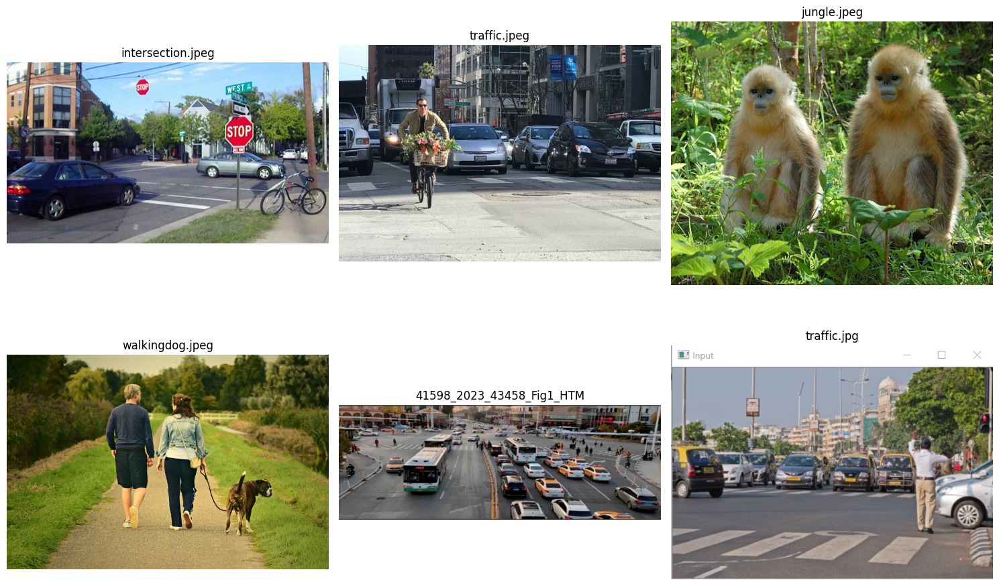

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()
for ax, img_path in zip(axes, IMAGE_PATHS):
    try:
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(img_path[:25])  # short title
        ax.axis('off')  # hide axis
    except Exception as e:
        ax.set_title("Error loading")
        ax.text(0.5, 0.5, f"Missing:\n{img_path}", ha='center', va='center')
        ax.axis('off')

plt.tight_layout()
plt.show()

#### **Download and extract model files**

Get URLs from the "Object Detection Zoo": https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

In [19]:
url= 'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz'

In [20]:
PATH_TO_MODEL_DIR = tf.keras.utils.get_file(
    fname= 'efficientdet_d2_coco17_tpu-32',
    origin=url,
    untar=True
)

62929273/62929273 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [21]:
PATH_TO_MODEL_DIR

'/root/.keras/datasets/efficientdet_d2_coco17_tpu-32'

#### **Download Labels File**

Label files can be found here: https://github.com/tensorflow/models/tree/master/research/object_detection/data

You probably won't need these since Object Detection Zoo contains only models trained on COCO.



🧠 What’s happening when you run the detector

* Your downloaded model (e.g. ssd_resnet101_v1_fpn_640x640_coco17_tpu-8)
was trained on COCO dataset.

* During inference, the model outputs things like:


```
detections['detection_boxes']      # bounding boxes
detections['detection_classes']    # class IDs (1, 2, 3, ...)
detections['detection_scores']     # confidence scores

```



In [22]:
url1 = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/data/mscoco_label_map.pbtxt'

In [23]:
PATH_TO_LABELS = tf.keras.utils.get_file(
    fname='mscoco_label_map.pbtxt',
    origin=url1,
    untar=False)

5056/5056 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [24]:
PATH_TO_LABELS

'/root/.keras/datasets/mscoco_label_map.pbtxt'

In [25]:
!head {PATH_TO_LABELS}

item {
  name: "/m/01g317"
  id: 1
  display_name: "person"
}
item {
  name: "/m/0199g"
  id: 2
  display_name: "bicycle"
}


#### **Load in the model**

In [32]:
MODEL_DIR = os.path.join(PATH_TO_MODEL_DIR, "efficientdet_d2_coco17_tpu-32")
PATH_TO_SAVED_MODEL = os.path.join(MODEL_DIR, "saved_model")


In [33]:
!ls {PATH_TO_SAVED_MODEL}


assets	saved_model.pb	variables


In [34]:
print('Loading model...', end='')
start_time = time.time()

detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()

elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...

Done! Took 129.02637887001038 seconds


#### **Load in the labels**

In [35]:
category_index = label_map_util.create_category_index_from_labelmap(
    PATH_TO_LABELS,
    use_display_name=True)

In [36]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

#### Helper Function

In [37]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


#### **Do some object detectiont**

In [52]:
im = IMAGE_PATHS[1]

In [53]:
print('Running Inference for {}...'.format(im) ,end='')

Running Inference for traffic.jpeg...

array([[[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [ 74,  91, 109],
        [ 88, 105, 123],
        [ 95, 112, 130]],

       [[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [ 94, 111, 129],
        [104, 121, 139],
        [108, 125, 143]],

       [[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [102, 118, 134],
        [107, 123, 139],
        [109, 125, 141]],

       ...,

       [[203, 206, 199],
        [204, 207, 200],
        [223, 226, 219],
        ...,
        [225, 225, 217],
        [238, 237, 232],
        [230, 229, 224]],

       [[186, 191, 184],
        [203, 208, 201],
        [192, 197, 190],
        ...,
        [220, 221, 213],
        [199, 200, 192],
        [203, 204, 196]],

       [[210, 215, 208],
        [215, 220, 213],
        [212, 217, 210],
        ...,
        [229, 230, 222],
        [211, 212, 204],
        [210, 211, 203]]], dtype=uint8)
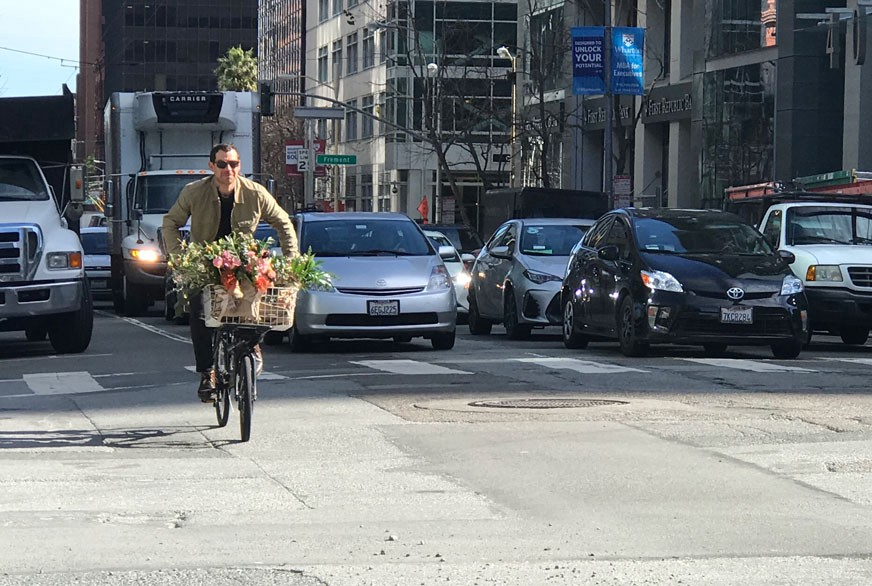

In [55]:
image_np = load_image_into_numpy_array(im)
image_np

In [56]:
input_tensor= tf.convert_to_tensor(image_np)
input_tensor

<tf.Tensor: shape=(586, 872, 3), dtype=uint8, numpy=
array([[[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [ 74,  91, 109],
        [ 88, 105, 123],
        [ 95, 112, 130]],

       [[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [ 94, 111, 129],
        [104, 121, 139],
        [108, 125, 143]],

       [[235, 253, 255],
        [235, 253, 255],
        [235, 253, 255],
        ...,
        [102, 118, 134],
        [107, 123, 139],
        [109, 125, 141]],

       ...,

       [[203, 206, 199],
        [204, 207, 200],
        [223, 226, 219],
        ...,
        [225, 225, 217],
        [238, 237, 232],
        [230, 229, 224]],

       [[186, 191, 184],
        [203, 208, 201],
        [192, 197, 190],
        ...,
        [220, 221, 213],
        [199, 200, 192],
        [203, 204, 196]],

       [[210, 215, 208],
        [215, 220, 213],
        [212, 217, 210],
        ...,
        [229, 230, 22

In [57]:
input_tensor= input_tensor[tf.newaxis, ...]
input_tensor

<tf.Tensor: shape=(1, 586, 872, 3), dtype=uint8, numpy=
array([[[[235, 253, 255],
         [235, 253, 255],
         [235, 253, 255],
         ...,
         [ 74,  91, 109],
         [ 88, 105, 123],
         [ 95, 112, 130]],

        [[235, 253, 255],
         [235, 253, 255],
         [235, 253, 255],
         ...,
         [ 94, 111, 129],
         [104, 121, 139],
         [108, 125, 143]],

        [[235, 253, 255],
         [235, 253, 255],
         [235, 253, 255],
         ...,
         [102, 118, 134],
         [107, 123, 139],
         [109, 125, 141]],

        ...,

        [[203, 206, 199],
         [204, 207, 200],
         [223, 226, 219],
         ...,
         [225, 225, 217],
         [238, 237, 232],
         [230, 229, 224]],

        [[186, 191, 184],
         [203, 208, 201],
         [192, 197, 190],
         ...,
         [220, 221, 213],
         [199, 200, 192],
         [203, 204, 196]],

        [[210, 215, 208],
         [215, 220, 213],
         [212, 217

In [58]:
detections = detect_fn(input_tensor)

In [59]:
detections

{'detection_anchor_indices': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
 array([[105358.,  89687., 105282., 105254.,  25499., 104991.,  92140.,
         105382., 105207., 105382.,  23779.,  87290., 104807.,  24290.,
          88640.,  23761., 104807.,  86858.,  89542.,  89062., 105376.,
         105679., 104775.,  89975., 105463.,   6274.,  87806., 105684.,
           8907.,  90845., 105032.,  36512., 105239.,  87969.,  87290.,
          26386., 105022.,   4290.,  88670.,  87969.,  26981.,  23479.,
         104793.,  27232.,  89992.,  26227., 104811.,  19326.,  88097.,
          89664.,  22890.,  89530.,  87779.,  89052.,   4308.,  89633.,
          18959.,  20094.,  87788.,  89954.,  19335.,  21690.,  19317.,
         105485.,  26099.,  19944.,  90164.,  25291.,  91258.,  18240.,
          26109.,  88925., 105906., 105462.,  89087.,   4277.,  91268.,
          90843., 105459., 104817., 104786.,  19172.,  89982., 105256.,
         104793.,  89089., 105693.,   2490.,  37366.,  27

In [60]:
num_detections = int(detections.pop('num_detections'))
num_detections

100

In [61]:
detections= {key : value[0, : num_detections].numpy()
              for key, value in detections.items()}

In [62]:
detections['num_detections'] = num_detections

In [63]:
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)


Done


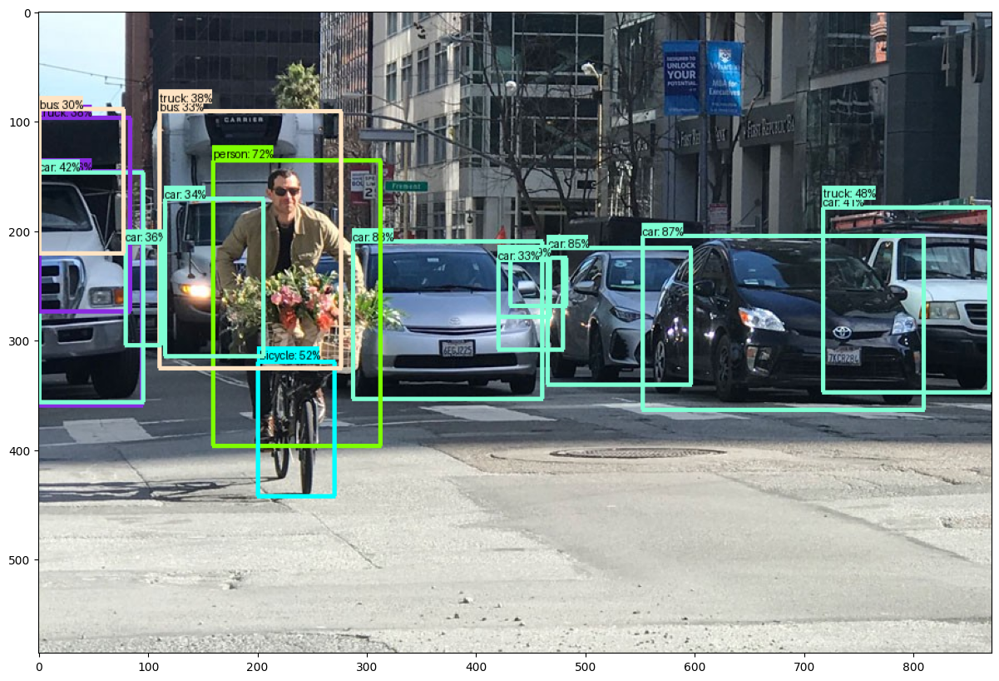

In [65]:
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.30,
        agnostic_mode=False)

plt.figure(figsize=(15, 10))
plt.imshow(image_np_with_detections)
print('Done')
plt.show()

#### Create Function to detect

In [66]:
def detect_Object(img_path):
  print('Running Inference for {}...'.format(img_path) ,end='')
  image_np = load_image_into_numpy_array(img_path)

  input_tensor= tf.convert_to_tensor(image_np)
   # The model expects a batch of images,
   # so add an axis with `tf.newaxis`.

  input_tensor= input_tensor[tf.newaxis, ...]

  # Model detection
  detections = detect_fn(input_tensor)

  num_detections = int(detections.pop('num_detections'))
  detections= {key : value[0, : num_detections].numpy()
              for key, value in detections.items()}

  detections['num_detections'] = num_detections

  # detection_classes should be ints.
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.30,
        agnostic_mode=False)

  plt.figure(figsize=(15, 10))
  plt.imshow(image_np_with_detections)
  print('Done')
  plt.show()


# 💻 Object Detection Function Breakdown (Step-by-Step)

This function, `detect_Object(img_path)`, takes an image file path, runs an object detection model on it, processes the results, and displays the image with the detected objects highlighted by bounding boxes and labels.

---

## 📌 The 6 Key Steps

### 1️⃣ Image Loading & Conversion
* **Action:** `load_image_into_numpy_array(img_path)`
* The image is loaded and converted into a **NumPy array** (`(H, W, 3)` shape), which is the base format for processing.

### 2️⃣ Tensor Conversion & Batching
* **Action:** `tf.convert_to_tensor(...)` and `input_tensor[tf.newaxis, ...]`
* The NumPy array is converted to a **TensorFlow Tensor**.
* A **batch dimension** of `1` is added, changing the shape to `(1, H, W, 3)`, as the model expects a batch (even if it's a batch of one).

### 3️⃣ Model Inference
* **Action:** `detections = detect_fn(input_tensor)`
* The pre-loaded object detection model (`detect_fn`) runs its inference, returning raw predictions like **boxes**, **scores**, and **class IDs**.

### 4️⃣ Result Preprocessing
* **Action:** Conversion to NumPy, result filtering, and type casting.
* The raw Tensor results are converted into more manageable **NumPy arrays**.
* Class IDs are ensured to be **integers** (e.g., from `1.0` to `1`).

### 5️⃣ Visualization
* **Action:** `viz_utils.visualize_boxes_and_labels_on_image_array(...)`
* The core visualization step. It uses the coordinates, scores, and class IDs to **draw bounding boxes** and **labels** on a copy of the original image.
* It applies filtering, only showing results above a set **confidence threshold** (e.g., 30%).

### 6️⃣ Display
* **Action:** `plt.imshow(...)` and `plt.show()`
* The final image, now augmented with the detection results, is displayed using Matplotlib.

---

## 🔥 Summary
The function wraps the entire Object Detection pipeline: **Load $\rightarrow$ Preprocess $\rightarrow$ Detect $\rightarrow$ Visualize $\rightarrow$ Display.**

Running Inference for intersection.jpeg...Done


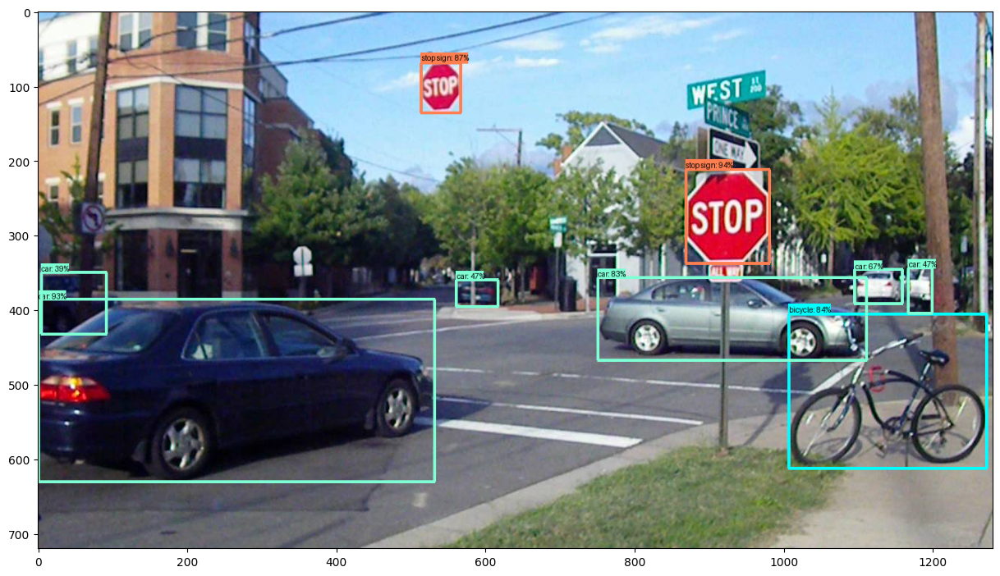

In [68]:
detect_Object(IMAGE_PATHS[0])

Running Inference for jungle.jpeg...Done


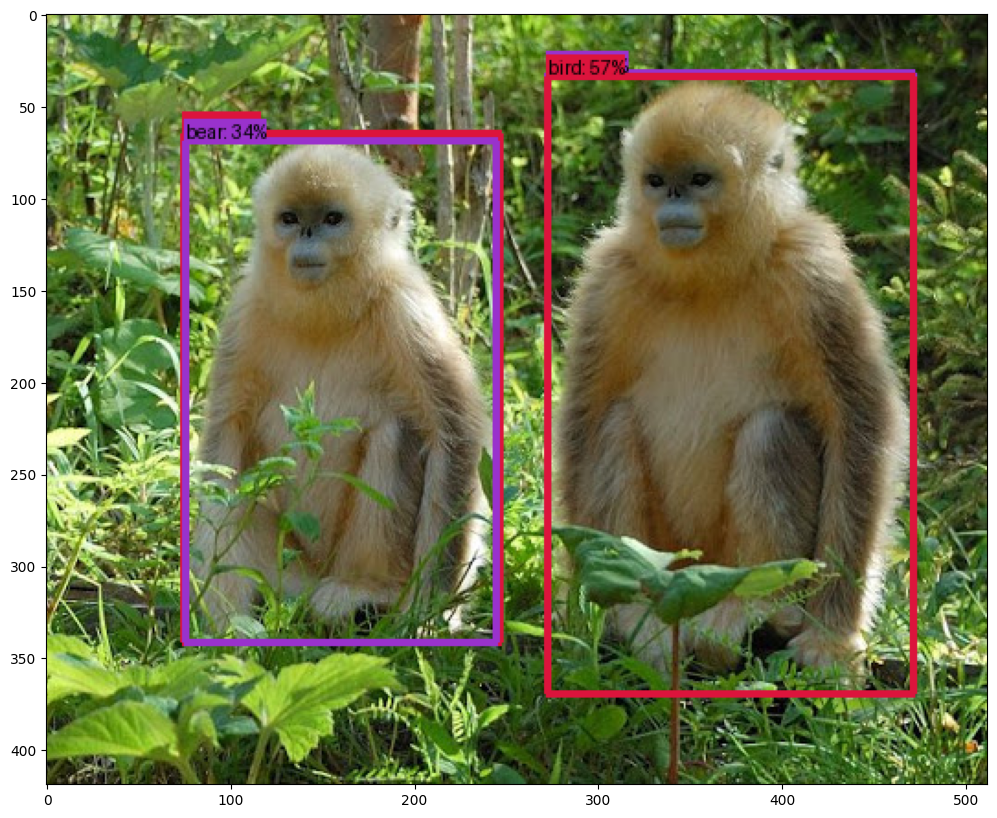

In [69]:
detect_Object(IMAGE_PATHS[2])

Running Inference for walkingdog.jpeg...Done


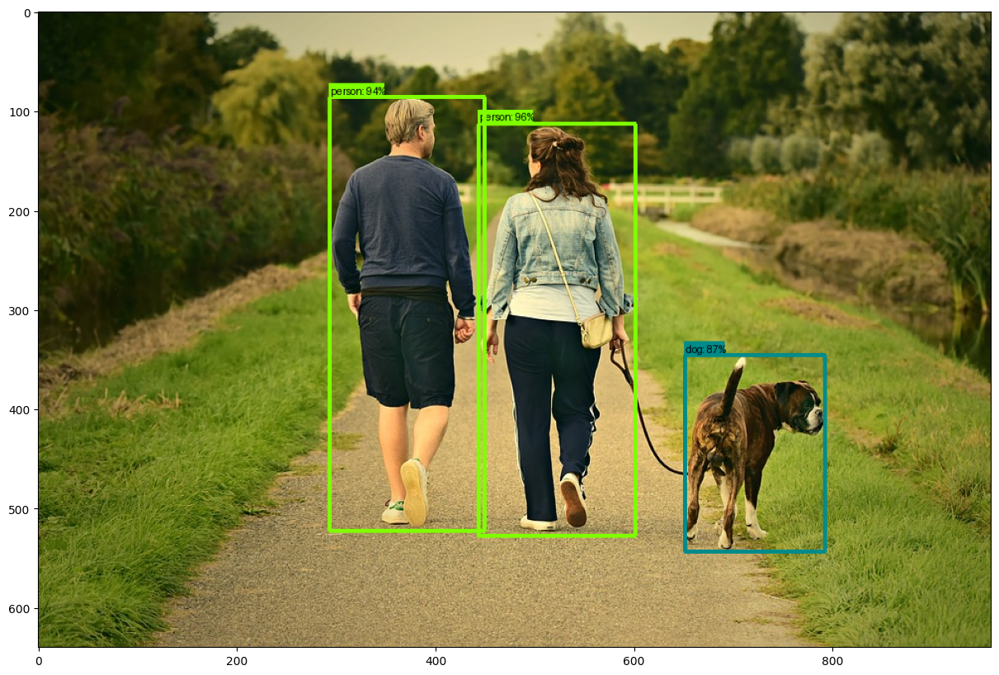

In [70]:
detect_Object(IMAGE_PATHS[3])

Running Inference for 41598_2023_43458_Fig1_HTML.jpg?as=webp...Done


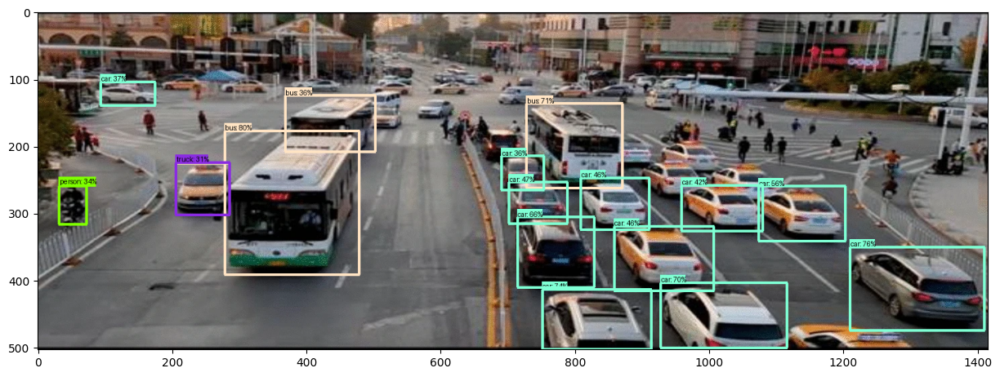

In [71]:
detect_Object(IMAGE_PATHS[4])

Running Inference for traffic.jpg...Done


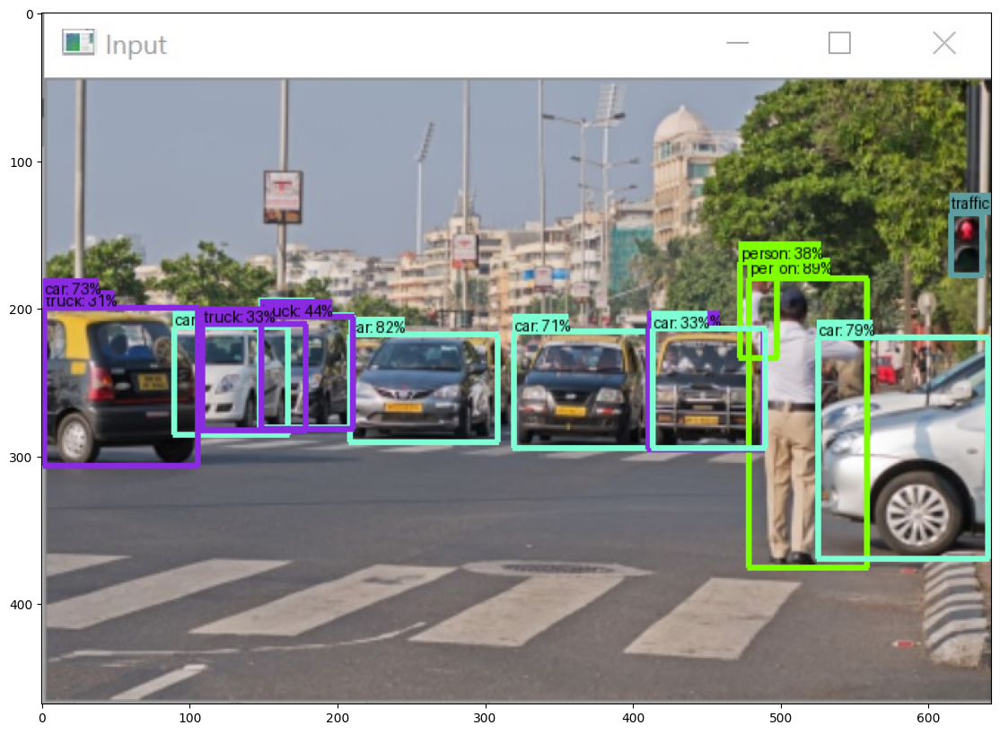

In [74]:
detect_Object(IMAGE_PATHS[5])